In [4]:
import sys
import os
import pickle
import logging
logging.getLogger('matplotlib.font_manager').disabled = True

# Add the src directory to sys.path
src_path = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(src_path)

import src as fa
from src import Experiment, PipelineSettings, ScopeClass, Pycromanager2NativeDataType, PipelineDataClass, Pipeline, ConsolidateImageShapes, TrimZSlices, CalculateSharpness, AutomaticSpotDetection, CellSegmentationStepClass, SpotDetectionStepClass, SavePDFReport, Luis_Additional_Plots, Move_Results_To_Analysis_Folder, Send_Data_To_Nas, Make_Output_Dir
from src.Util import MergeChannels
print('Will it blend?')

Will it blend?


In [5]:
# User Inputs
raw_data_dir = r"C:\Users\Jack\Desktop\H128_Tiles_100ms_5mW_Blue_15x15_10z_05step_2"
diameter_nucleus=100                         # Approximate nucleus size in pixels
diameter_cytosol=200                         # Approximate cytosol size in pixels
psf_z=350                                    # Theoretical size of the PSF emitted by a [rna] spot in the z plan, in nanometers
psf_yx=130                                   # Theoretical size of the PSF emitted by a [rna] spot in the yx plan, in nanometers
voxel_size_z=500                             # Microscope conversion px to nanometers in the z axis.
voxel_size_yx=130                            # Microscope conversion px to nanometers in the xy axis.
minimum_spots_cluster = 10                    # Minimal value used to define a cluster.
number_of_images_to_process = 2 #None           # Use an integer to process a subset of images. None is used to indicate that all images need to be processed.
optimization_segmentation_method= 'default' #'default'  #'default'  #'default' #'default'   # optimization_segmentation_method = 'default', 'intensity_segmentation' 'z_slice_segmentation', 'gaussian_filter_segmentation' , None
save_all_images=0                             # To save all images for all the z-slices
save_filtered_images = False                  # To save filtered images.
threshold_for_spot_detection=None #400#None   # To select an specific threshold for spot detection. The default is None, and use automated threshold detection.
show_plots=1                                  # Flag to show plots
send_data_to_NAS=0                            # If data sent back to NAS use 1
download_data_from_NAS=0                      # If data downloaded from NAS use 1
remove_z_slices_borders=0                     # Use this flag to remove 2 z-slices from the top and bottom of the stack. This is needed to remove z-slices that are out of focus.
save_pdf_report=0                             # Use this flag to save a pdf report with the results.
display_spots_on_multiple_z_planes=0         # Use this flag to display spots on multiple z-planes.
remove_out_of_focus_images = False,          # Use this flag to remove out of focus images.
sharpness_threshold =1.00                    # Use this threshold to remove out of focus images.


# Build Setting Classes
pipelineSettings = PipelineSettings(return_data_to_NAS=send_data_to_NAS, 
                                    optimization_segmentation_method=optimization_segmentation_method,
                                    save_all_imgs=save_all_images,
                                    save_all_filtered_imgs=save_filtered_images,
                                    threshold_for_spot_detection=threshold_for_spot_detection,
                                    NUMBER_OF_CORES=4,
                                    NUMBER_Z_SLICES_TO_TRIM=2,
                                    remove_z_slices_borders=True,
                                    MINIMAL_NUMBER_OF_Z_SLICES_TO_CONSIDER_A_3D_IMAGE=5,
                                    user_select_number_of_images_to_run=2,
                                    local_or_NAS=0,
                                    sharpness_threshold=sharpness_threshold,
                                    show_plots=show_plots,
                                    save_masks_as_file=1,)

pipelineSettings.bigfish_alpha = 0.5

terminatorScope = ScopeClass()

experiment = Experiment(raw_data_dir, voxel_size_z=voxel_size_z)



In [6]:
# Set Up Data
importData = True
if importData:
    NativeData = Pycromanager2NativeDataType(experiment, pipelineSettings, terminatorScope, r"C:\Users\Jack\Desktop\config.yml")

    experiment.nucChannel = [0]
    experiment.FISHChannel = [0]
    # experiment.number_of_channels = NativeData.number_color_channels
    # experiment.number_of_timepoints = NativeData.number_of_timepoints
    # experiment.number_of_Z = NativeData.number_z_slices
    # experiment.number_of_FOVs = NativeData.number_of_fov
    # experiment.number_of_Timepoints = NativeData.number_of_timepoints
    # experiment.number_of_images_to_process = experiment.number_of_FOVs * experiment.number_of_timepoints
    # experiment.list_initial_z_slices_per_image = NativeData.list_nZ
    # experiment.list_timepoints = NativeData.list_tps

    pipelineData = PipelineDataClass(NativeData.local_data_dir, total_num_imgs=experiment.number_of_images_to_process, list_image_names=NativeData.list_files_names, list_images=NativeData.list_images)
    pickle.dump(pipelineData, open('pipelineData.p', 'wb'))
    pickle.dump(experiment, open('experiment.p', 'wb'))


pipelineData = pickle.load(open('pipelineData.p', 'rb'))
experiment = pickle.load(open('experiment.p', 'rb'))




# Create Pipeline 
prePipelineSteps = [ConsolidateImageShapes(), TrimZSlices(), CalculateSharpness(), AutomaticSpotDetection(), Make_Output_Dir()]
pipelineSteps = [CellSegmentationStepClass(), SpotDetectionStepClass()]
postPipelineSteps = [SavePDFReport(), Luis_Additional_Plots(), Move_Results_To_Analysis_Folder()]
pipeline = Pipeline(pipelineSettings, terminatorScope, experiment, pipelineData, prePipelineSteps, postPipelineSteps, pipelineSteps)


Image shape:  (225, 11, 512, 512) 

Number of images:  1 

Local directory with images:  C:\Users\Jack\Desktop\H128_Tiles_100ms_5mW_Blue_15x15_10z_05step_2 

Dataset opened                 
Number of z slices:  11 
 Number of color channels:  1 
Number of FOV:  225 
 Number of TimePoints 1 
 
 



In [7]:
# Run pre pipeline steps
runPreProcessing = True
if runPreProcessing:
    pipeline.run_pre_pipeline_steps()
    pickle.dump(pipeline.pipelineData, open('PrePipelineData.pkl', 'wb'))

pipelineData = pickle.load(open('PrePipelineData.pkl', 'rb'))
pipeline.pipelineData = pipelineData



ConsolidateImageShapes
Overwriting list_images in pipelineData
TrimZSlices
Overwriting list_images in pipelineData
CalculateSharpness
Overwriting list_images in pipelineData
AutomaticSpotDetection
Make_Output_Dir


DEBUG:matplotlib.pyplot:Loaded backend module://matplotlib_inline.backend_inline version unknown.
DEBUG:matplotlib.pyplot:Loaded backend module://matplotlib_inline.backend_inline version unknown.



 ###################### 
        IMAGE : 0
 ###################### 
    Image Name :   H128_Tiles_100ms_5mW_Blue_15x15_10z_05step_NDTiffStack_tp_0_fov_0.tif
    Original Image Shape :                     [11, 512, 512, 1]
    Trimmed z_slices at each border :         2


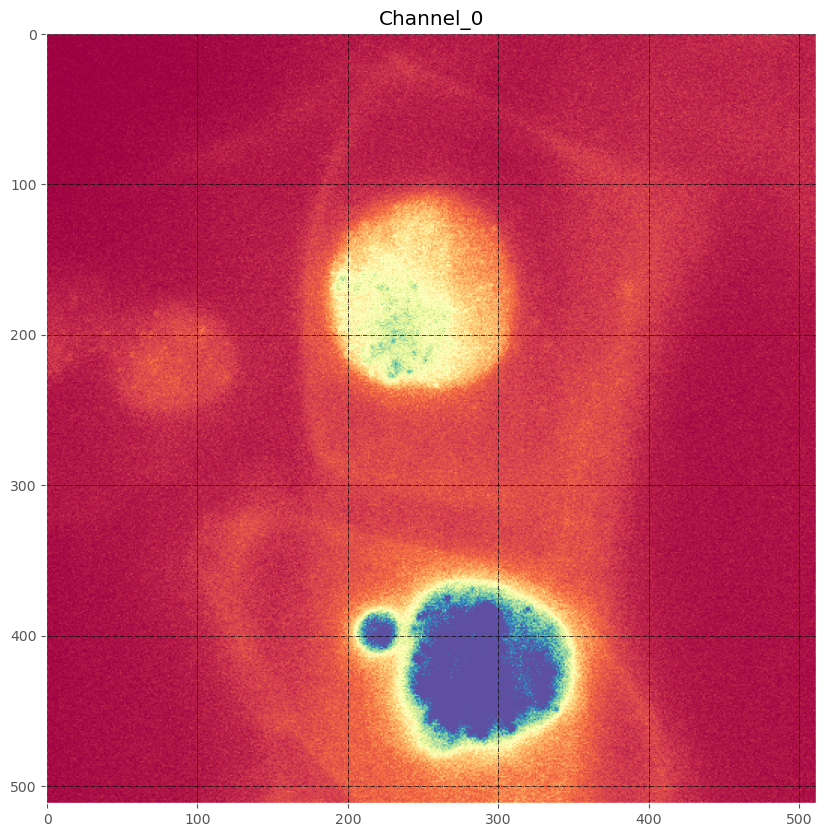

INFO:cellpose.core:** TORCH CUDA version installed and working. **
INFO:cellpose.core:>>>> using GPU
INFO:cellpose.models:>> cyto3 << model set to be used
INFO:cellpose.models:>>>> loading model C:\Users\Jack\.cellpose\models\cyto3
INFO:cellpose.models:>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
INFO:cellpose.models:channels set to [0, 0]
INFO:cellpose.models:~~~ FINDING MASKS ~~~
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=103)
           2	LOAD_GLOBAL(arg=0, lineno=117)
           4	LOAD_METHOD(arg=1, lineno=117)
           6	LOAD_GLOBAL(arg=2, lineno=117)
           8	LOAD_FAST(arg=1, lineno=117)
          10	CALL_FUNCTION(arg=1, lineno=117)
          12	LOAD_CONST(arg=1, lineno=117)
          14	BUILD_TUPLE(arg=2, lineno=117)
          16	LOAD_CONST(arg=2, lineno=117)
          18	CALL_METHOD(arg=2, lineno=117)
          20	STORE_FAST(arg=2, lineno=117)
          22	LOAD_GLOBAL(arg=0, lineno=118)
          24	LOAD_METHO

    Number of detected cells:                 3


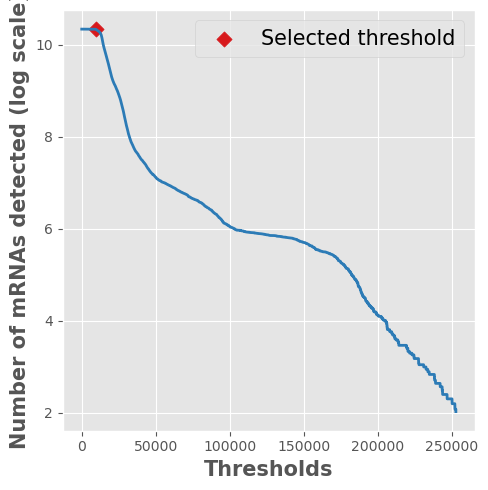

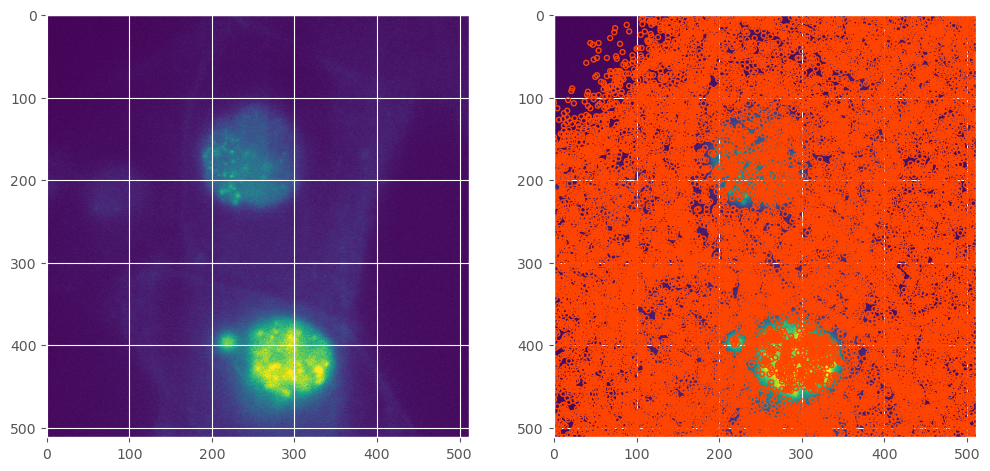

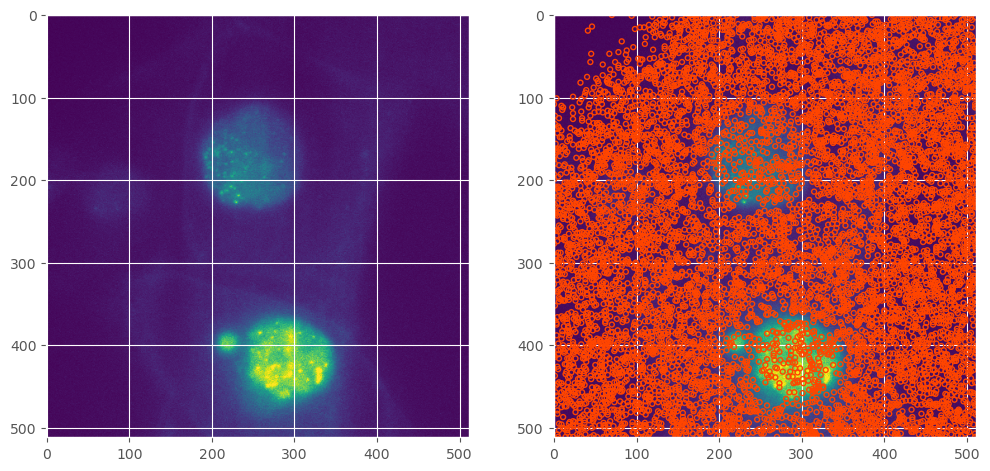

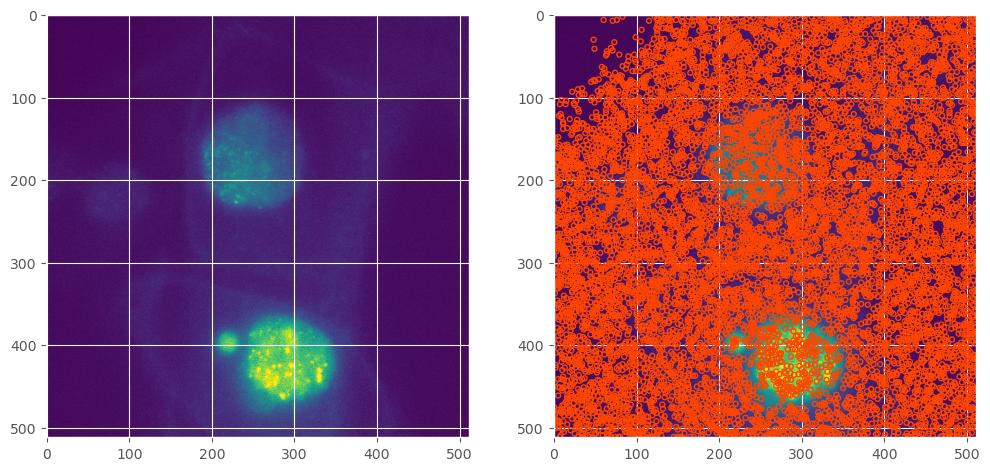

Z-Slice:  3


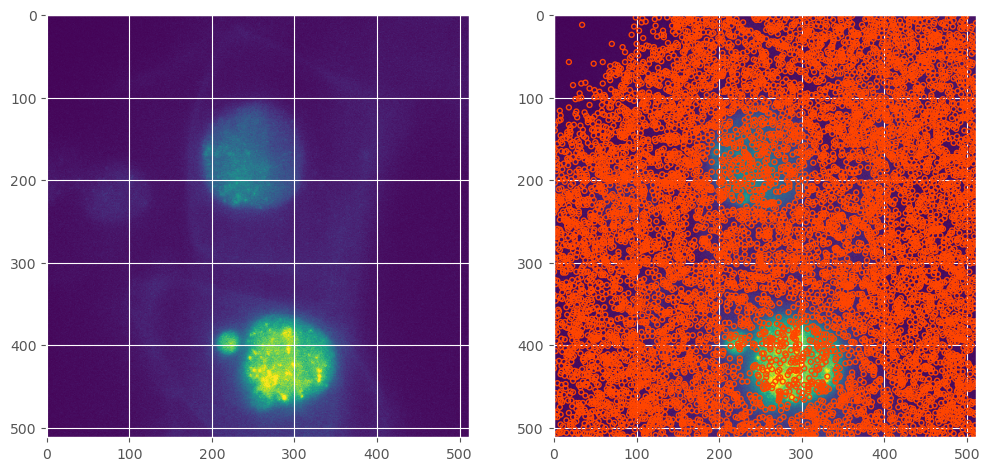

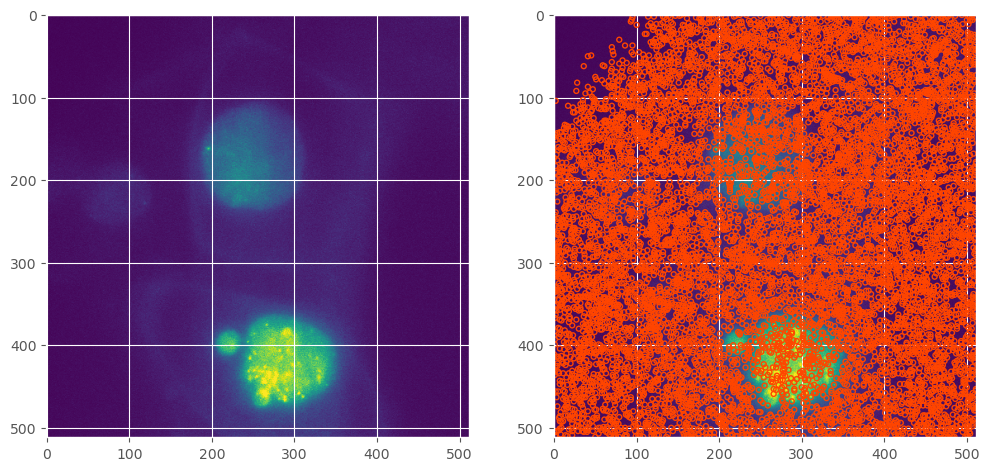

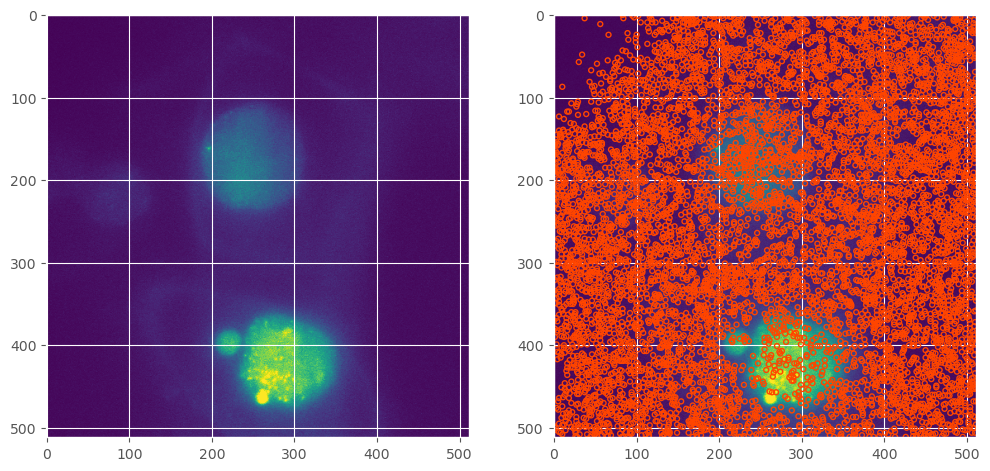

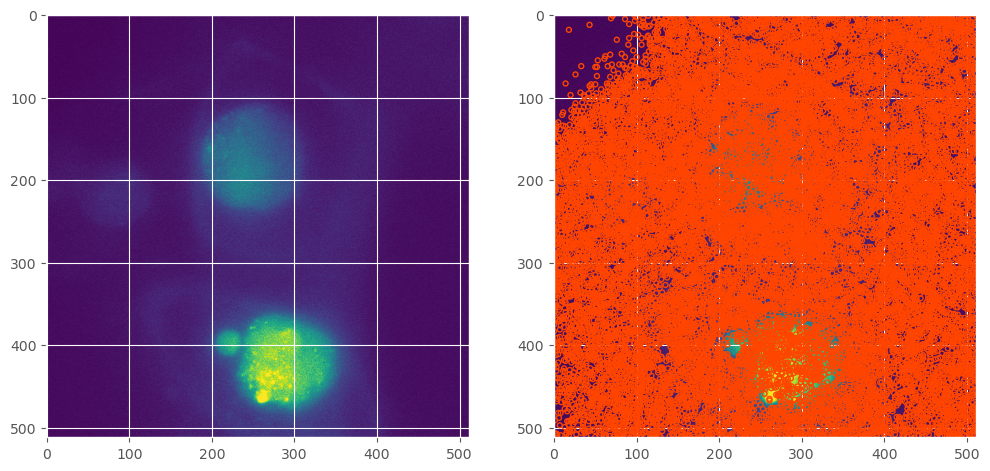

    Intensity threshold for spot detection :  [998.0]
    Average detected spots per cell :         [679]
    Maximum detected spots per cell :         [1040]


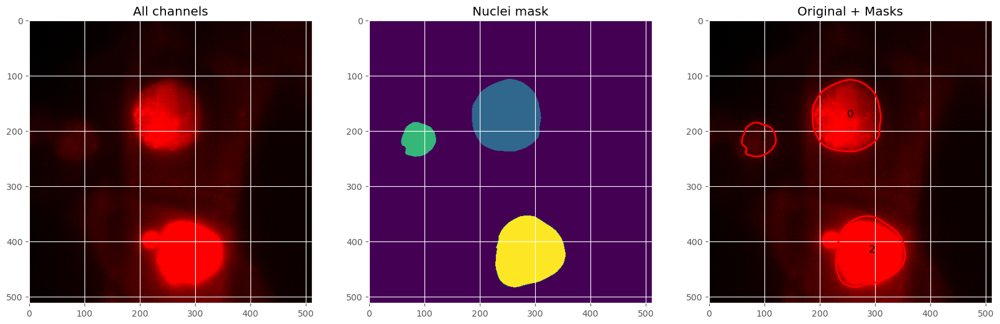


 ###################### 
        IMAGE : 1
 ###################### 
    Image Name :   H128_Tiles_100ms_5mW_Blue_15x15_10z_05step_NDTiffStack_tp_0_fov_1.tif
    Original Image Shape :                     [11, 512, 512, 1]
    Trimmed z_slices at each border :         2


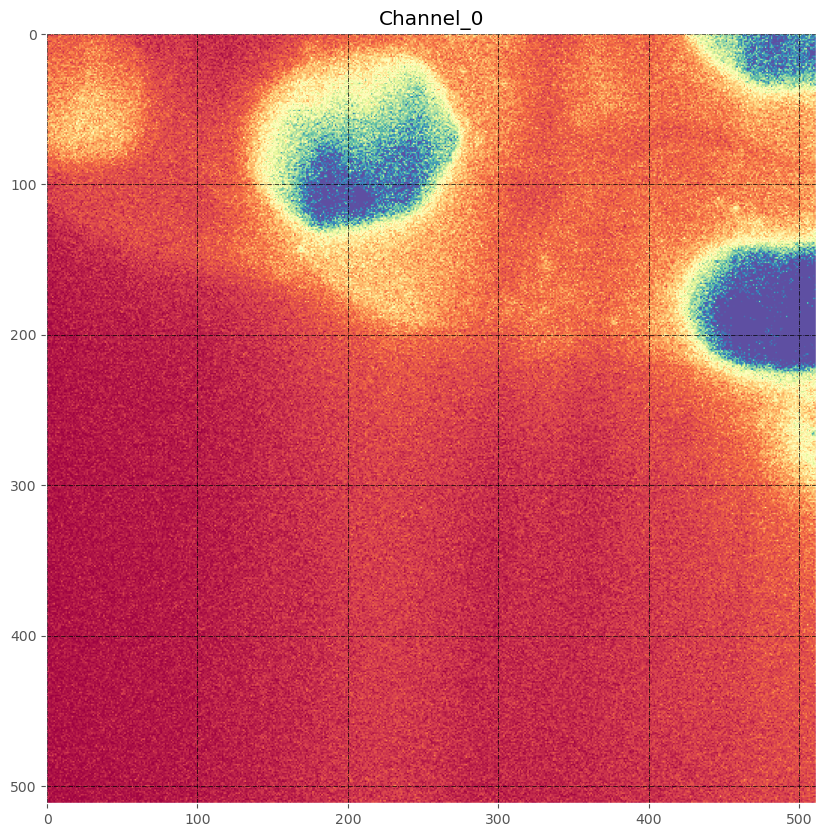

INFO:cellpose.core:** TORCH CUDA version installed and working. **
INFO:cellpose.core:>>>> using GPU
INFO:cellpose.models:>> cyto3 << model set to be used
INFO:cellpose.models:>>>> loading model C:\Users\Jack\.cellpose\models\cyto3
INFO:cellpose.models:>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
INFO:cellpose.models:channels set to [0, 0]
INFO:cellpose.models:~~~ FINDING MASKS ~~~
INFO:cellpose.models:>>>> TOTAL TIME 0.21 sec
INFO:cellpose.core:** TORCH CUDA version installed and working. **
INFO:cellpose.core:>>>> using GPU
INFO:cellpose.models:>> cyto3 << model set to be used
INFO:cellpose.models:>>>> loading model C:\Users\Jack\.cellpose\models\cyto3
INFO:cellpose.models:>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
INFO:cellpose.models:channels set to [0, 0]
INFO:cellpose.models:~~~ FINDING MASKS ~~~
INFO:cellpose.models:>>>> TOTAL TIME 0.22 sec
INFO:cellpose.core:** TORCH CUDA version installed and working. **
INFO:cell

    Number of detected cells:                 5


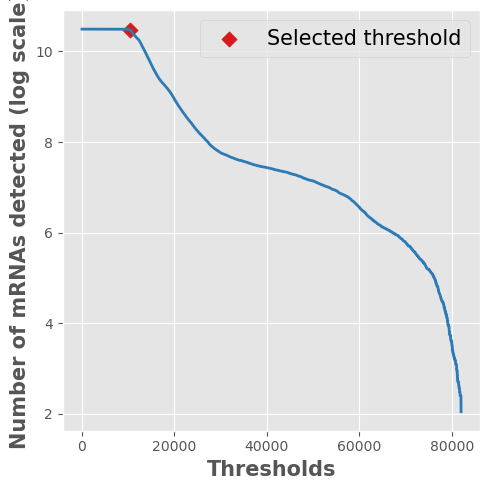

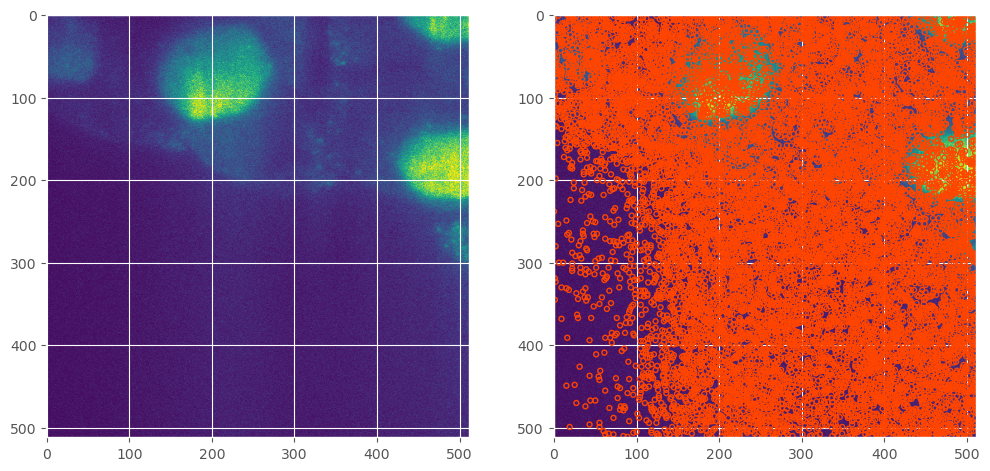

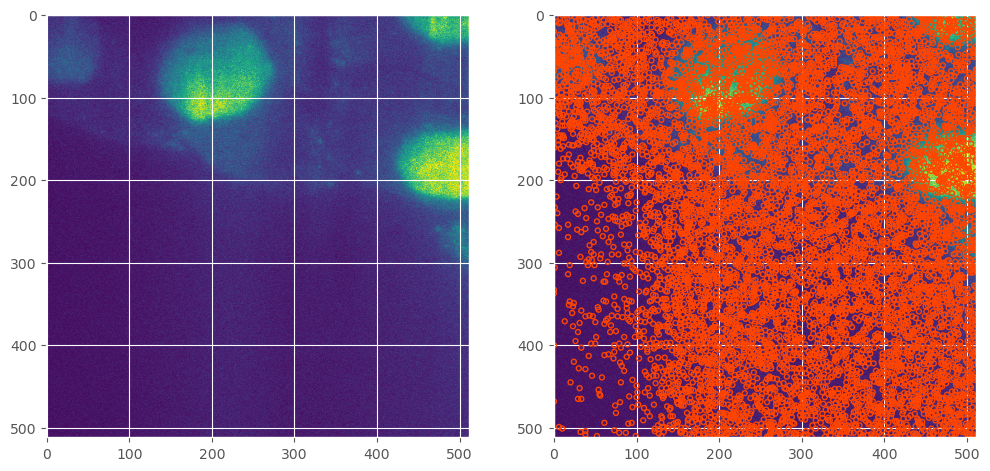

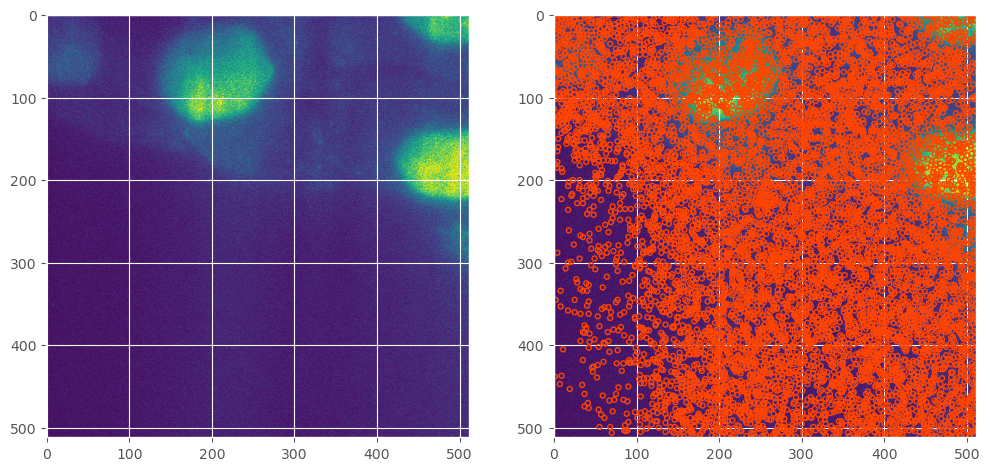

Z-Slice:  3


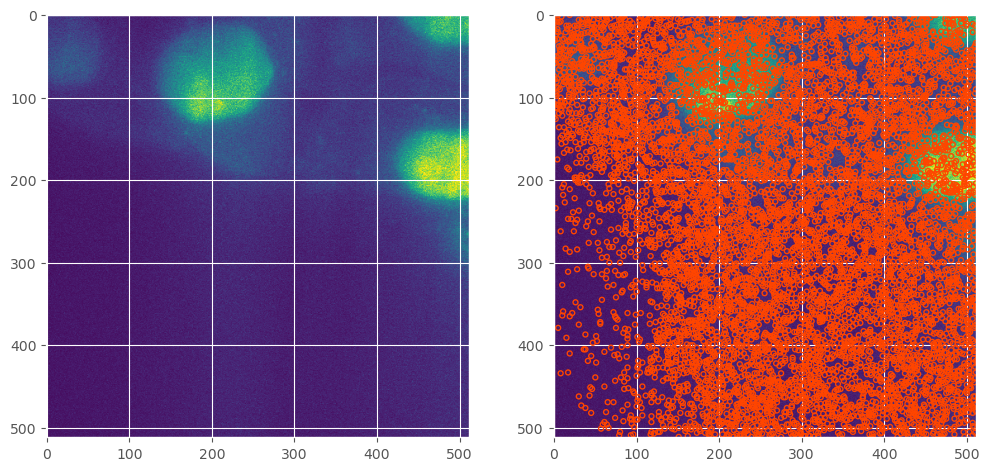

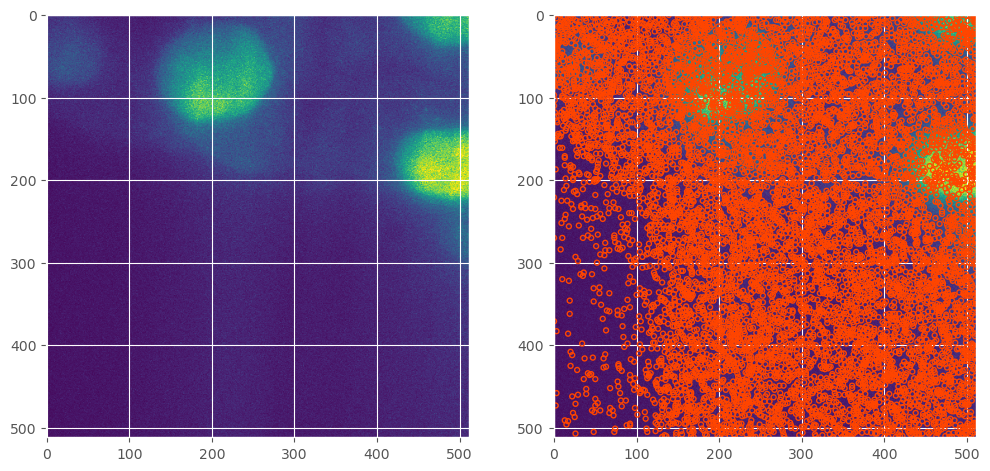

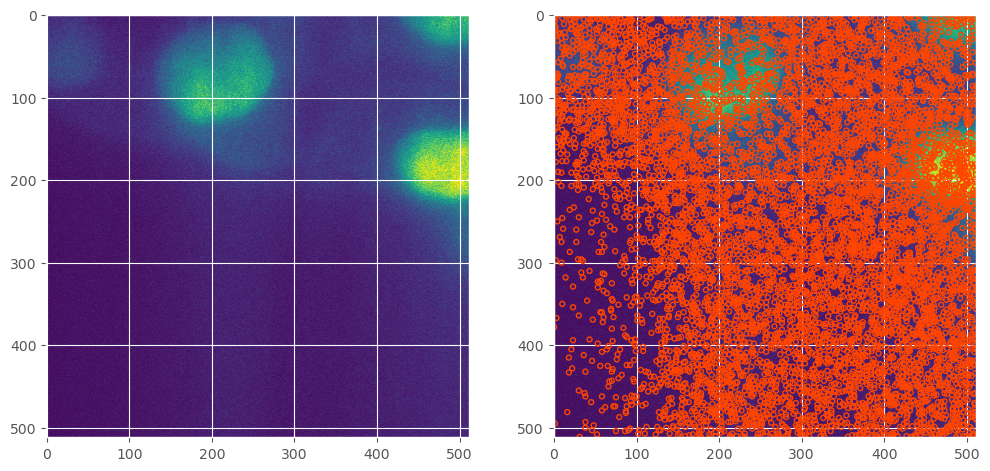

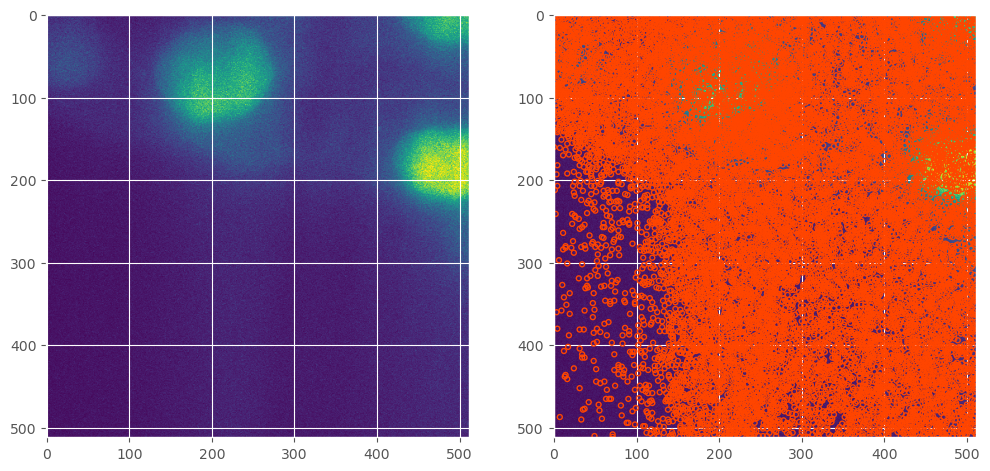

    Intensity threshold for spot detection :  [993.0]
    Average detected spots per cell :         [388]
    Maximum detected spots per cell :         [706]


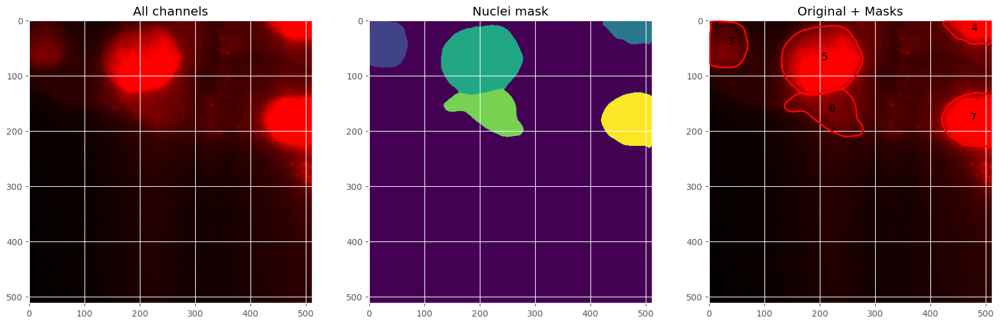

In [8]:
# Run pipeline steps
runPipeline = True
if runPipeline:
    pipeline.run_pipeline_steps()
    pickle.dump(pipeline.pipelineData, open('pipelineData.pkl', 'wb'))


pipelineData = pickle.load(open('pipelineData.pkl', 'rb'))
pipeline.pipelineData = pipelineData


DEBUG:matplotlib.backends.backend_pdf:Assigning font /F1 = 'C:\\Users\\Jack\\miniconda3\\envs\\FISH_env\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font C:\Users\Jack\miniconda3\envs\FISH_env\Lib\site-packages\matplotlib\mpl-data\fonts\ttf\DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.


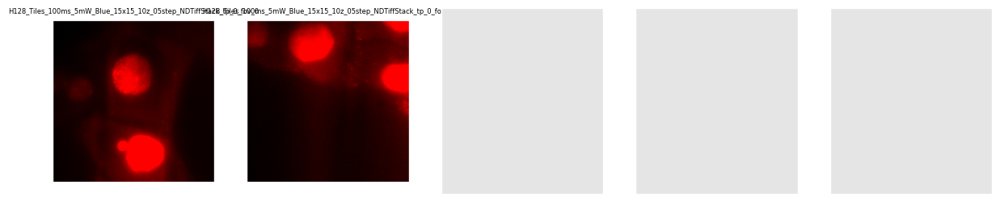

DEBUG:PIL.PngImagePlugin:STREAM b'IHDR' 16 13
DEBUG:PIL.PngImagePlugin:STREAM b'tEXt' 41 57
DEBUG:PIL.PngImagePlugin:STREAM b'pHYs' 110 9
DEBUG:PIL.PngImagePlugin:STREAM b'IDAT' 131 65536
DEBUG:PIL.PngImagePlugin:STREAM b'IHDR' 16 13
DEBUG:PIL.PngImagePlugin:STREAM b'tEXt' 41 57
DEBUG:PIL.PngImagePlugin:STREAM b'pHYs' 110 9
DEBUG:PIL.PngImagePlugin:STREAM b'IDAT' 131 65536
DEBUG:PIL.Image:Error closing: Operation on closed image
DEBUG:PIL.PngImagePlugin:STREAM b'IHDR' 16 13
DEBUG:PIL.PngImagePlugin:STREAM b'tEXt' 41 57
DEBUG:PIL.PngImagePlugin:STREAM b'pHYs' 110 9
DEBUG:PIL.PngImagePlugin:STREAM b'IDAT' 131 65536
DEBUG:PIL.PngImagePlugin:STREAM b'IHDR' 16 13
DEBUG:PIL.PngImagePlugin:STREAM b'tEXt' 41 57
DEBUG:PIL.PngImagePlugin:STREAM b'pHYs' 110 9
DEBUG:PIL.PngImagePlugin:STREAM b'IDAT' 131 65536
DEBUG:PIL.Image:Error closing: Operation on closed image
DEBUG:matplotlib.backends.backend_pdf:Assigning font /F1 = 'C:\\Users\\Jack\\miniconda3\\envs\\FISH_env\\Lib\\site-packages\\matplotli

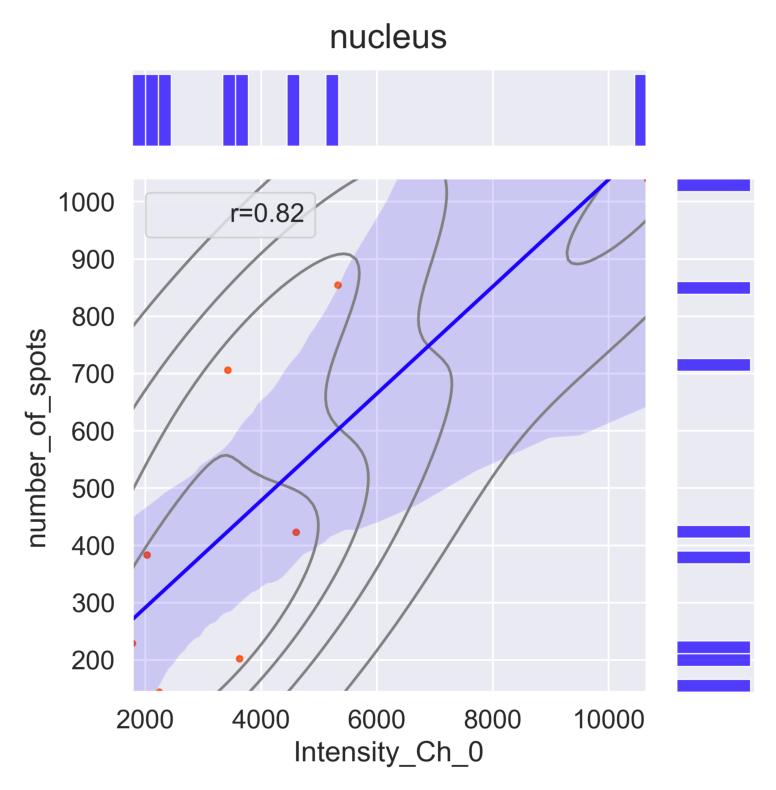

DEBUG:matplotlib.backends.backend_pdf:Assigning font /F1 = 'C:\\Windows\\Fonts\\arial.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font C:\Windows\Fonts\arial.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.


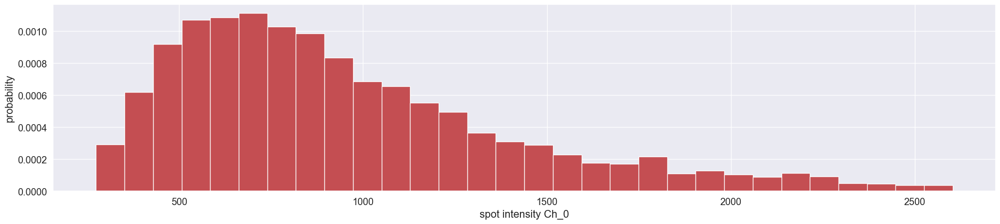

DEBUG:matplotlib.backends.backend_pdf:Assigning font /F1 = 'C:\\Windows\\Fonts\\arial.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font C:\Windows\Fonts\arial.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.


<Figure size 640x480 with 0 Axes>

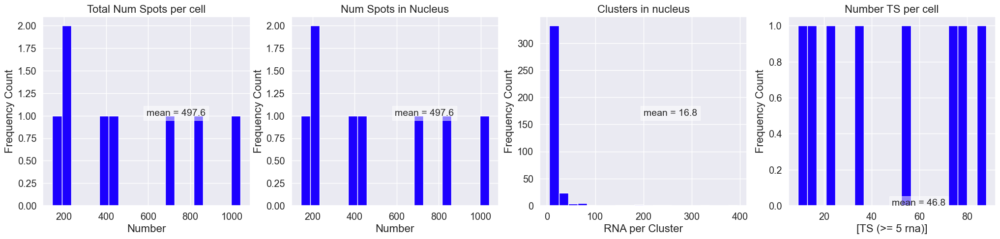

DEBUG:PIL.PngImagePlugin:STREAM b'IHDR' 16 13
DEBUG:PIL.PngImagePlugin:STREAM b'tEXt' 41 57
DEBUG:PIL.PngImagePlugin:STREAM b'pHYs' 110 9
DEBUG:PIL.PngImagePlugin:STREAM b'IDAT' 131 65536


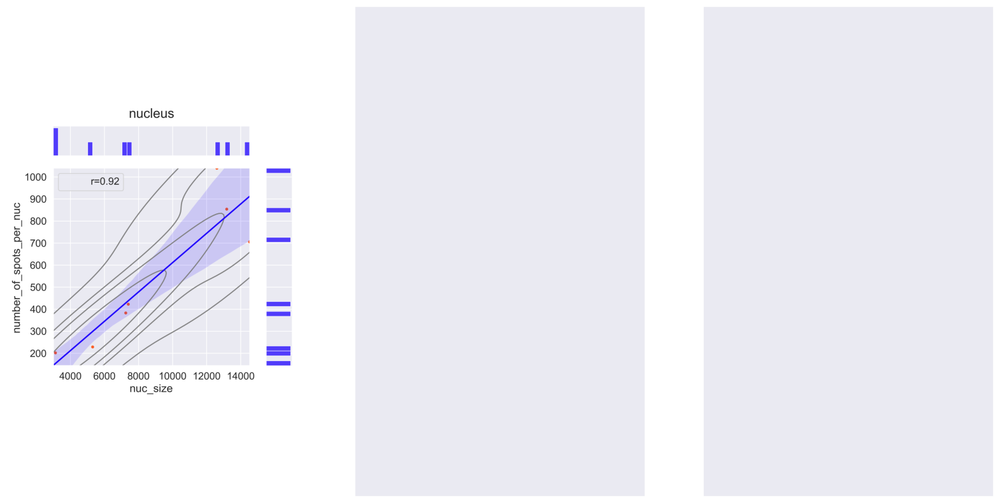

DEBUG:matplotlib.backends.backend_pdf:Assigning font /F1 = 'C:\\Windows\\Fonts\\arial.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font C:\Windows\Fonts\arial.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.


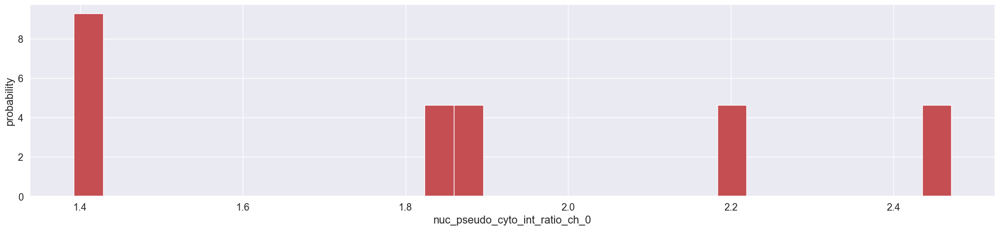

In [9]:
# Run post pipeline steps
pipeline.run_post_pipeline_steps()

pickle.dump(pipeline.pipelineData, open('PostPipelineData.pkl', 'wb'))

In [10]:
print('It will blend!')

It will blend!
